In [2]:
import geopandas as gpd
import matplotlib.pyplot as plt
from gtfo import Gtfo
from gtfo.busSim import BusSim
from gtfo.busSim.manager import managerFactory

# Visualize each simulation

In [4]:
GTFS_PATH = "./data/mmt_gtfs.zip"
CITY_PATH = "./data/plot/background/madison-meter-shp"
OUT_PATH = "/tmp"
DAY = "monday"
START_TIME = "12:00:00"
ELAPSE_TIME = "00:30:00"
AVG_WALKING_SPEED = 1.4 # 1.4 meters per second
MAX_WALKING_MIN = 10

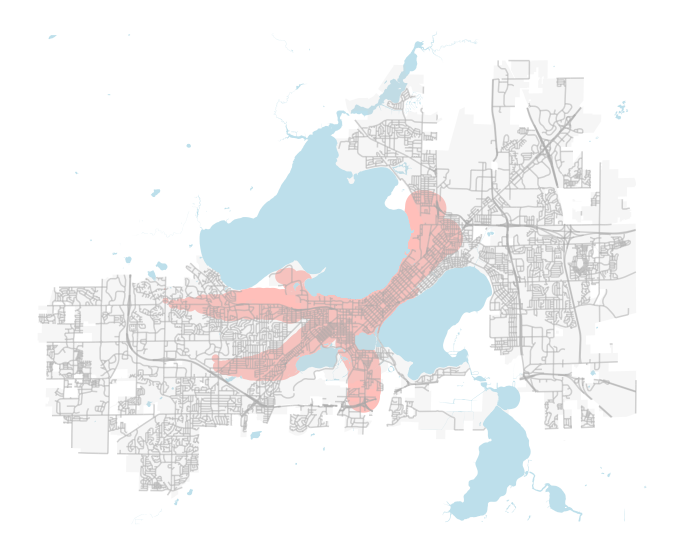

In [6]:
manager = managerFactory.create("local", gtfs_path=GTFS_PATH, city_path=CITY_PATH, out_path=OUT_PATH)
busSim = BusSim(manager, DAY, START_TIME, ELAPSE_TIME, AVG_WALKING_SPEED, MAX_WALKING_MIN)
gdf = busSim.get_gdf(start_point=(43.073691, -89.387407))
# print(busSim.get_area(gdf)) #32092971.01932718 #32090055.215094768

gdf = gdf.to_crs(epsg=4326)
city = gpd.read_file("./data/plot/background/madison-shp")
lakes = gpd.read_file("./data/plot/background/water-shp")
street = gpd.read_file("./data/plot/background/street-shp")

ax = city.plot(color="lightgray", alpha=.2, figsize=(12, 12), zorder=2)
lakes.plot(color="lightblue", ax=ax, zorder=1, alpha=0.8)
street.plot(color="darkgray", alpha = .5, ax=ax, zorder=3)
gdf.difference(lakes.unary_union).plot(color="#ffbfba", ax=ax)
# gdf["geometry"].centroid.plot(color="red", ax=ax, markersize=2)

ax.set_axis_off()


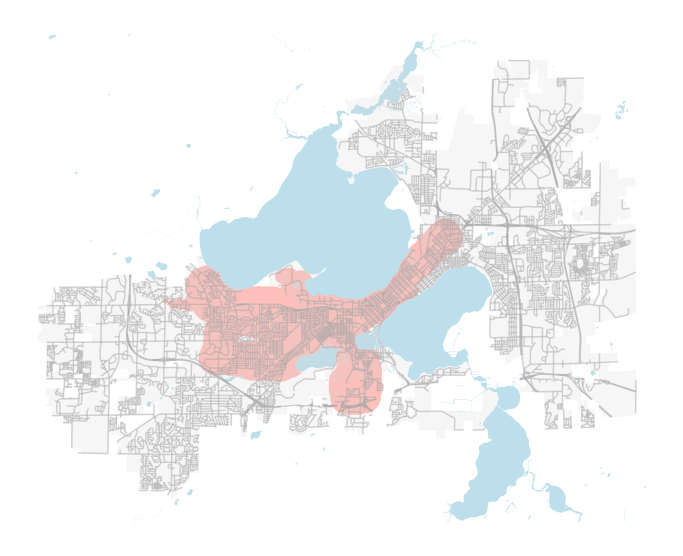

In [7]:
manager = managerFactory.create("local", gtfs_path=GTFS_PATH, city_path=CITY_PATH, out_path=OUT_PATH)
busSim = BusSim(manager, DAY, START_TIME, ELAPSE_TIME, AVG_WALKING_SPEED, MAX_WALKING_MIN)
gdf = busSim.get_gdf(765)
# print(busSim.get_area(gdf)) #39671876.26227871

gdf = gdf.to_crs(epsg=4326)
city = gpd.read_file("./data/plot/background/madison-shp")
lakes = gpd.read_file("./data/plot/background/water-shp")
street = gpd.read_file("./data/plot/background/street-shp")

ax = city.plot(color="lightgray", alpha=.2, figsize=(12, 12), zorder=2)
lakes.plot(color="lightblue", ax=ax, zorder=1, alpha=0.8)
street.plot(color="darkgray", alpha = .5, ax=ax, zorder=3)
gdf.difference(lakes.unary_union).plot(color="#ffbfba", ax=ax)
# gdf["geometry"].centroid.plot(color="red", ax=ax, markersize=2)

ax.set_axis_off()

# Run batch simulation locally

In [2]:
config = {
    "run_env": "local",
    "busSim_params": {
        "day": "monday",
        "elapse_time": "00:30:00",
        "avg_walking_speed": 1.4,
        "max_walking_min": 10,
        "grid_size_min": 2
    },
    "interval": "10:00:00",
    "start_points": [(43.073691, -89.387407)],
    "route_remove": [1, 10]
}

gtfo = Gtfo("./data/mmt_gtfs.zip", "./data/plot/background/madison-meter-shp", "/tmp")
search_result = gtfo.search(config)

Checking config obj


# Run batch simulation on AWS

In [ ]:
config = {
    "run_env": "aws",
    "busSim_params": {
        "day": "monday",
        "elapse_time": "00:30:00",
        "avg_walking_speed": 1.4,
        "max_walking_min": 10,
        "grid_size_min": 2
    },
    "interval": "10:00:00",
    "start_points": [(43.073691, -89.387407)],
    "route_remove": [1, 10]
}

gtfo = Gtfo("./data/mmt_gtfs.zip", "./data/plot/background/madison-meter-shp", "/tmp")
search_result = gtfo.search(config)

# Read result from a file

In [ ]:
# read the result from an archive file
result = Result.from_file(PATH)

# metadata read from the file
day = result.day
start_time = result.start_time
elapse_time = result.elapse_time
grid_size_min = result.grid_size_min
x_num = result.x_num
y_num = result.y_num

# get a data reader to read a series of (bit_map, location) pair
reader = result.get_reader(route_remove=80)
    
for bit_map, location in reader.read():
    # do something analysis with bit_map and location
    pass

In [1]:
from gtfo.busSim.manager import managerFactory
aws = managerFactory.create("aws", gtfs_path=None, city_path=None, out_path=None)

creating s3 bucket
creating IAM role
packaging lambda function
deploying lambda function


In [2]:
aws.clean_up()

cleaning up aws resources
cleaning up s3
cleaning up lambda


In [5]:
import boto3
aws_lambda = boto3.client('lambda', region_name='ap-northeast-1')
with open("tmp.zip", 'rb') as f:
    response = aws_lambda.create_function(
        Code={
            'ZipFile': f.read()
        },
        Description='BusSim handler',
        FunctionName="test",
        Handler='lambda_function.lambda_handler',
        MemorySize=512,
        Publish=True,
        Role="arn:aws:iam::347664766527:role/s3rwRole",
        Runtime='python3.8',
        Timeout=900,
        TracingConfig={
            'Mode': 'Active',
        },
    )